In [1]:
import json
import pandas as pd
from GeoPlot.interactive import Map


with open('RoutePlanner_fuel_output.json', 'r') as f:
    info = json.load(f)

config = info['config']
mesh   = pd.DataFrame(info['cellboxes'])


## Plotting the Waypoints & Sea-Ice Concentration


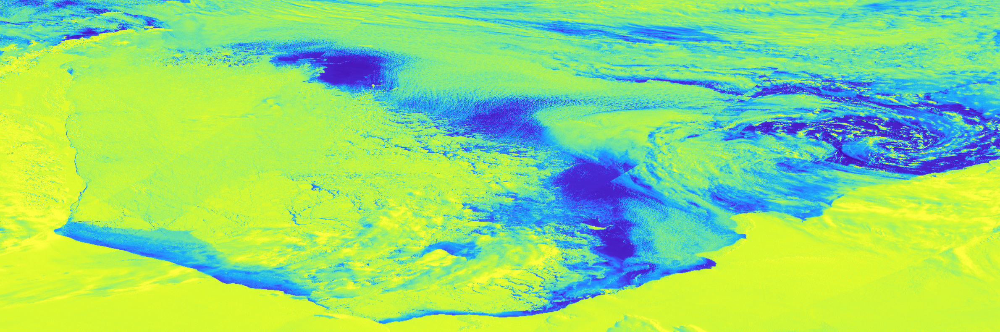
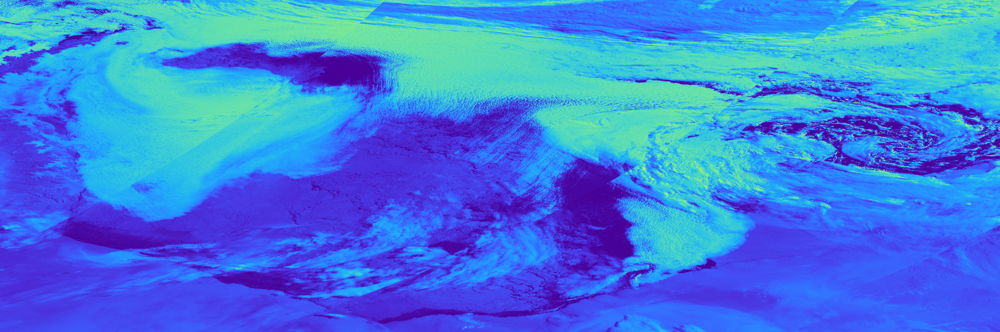
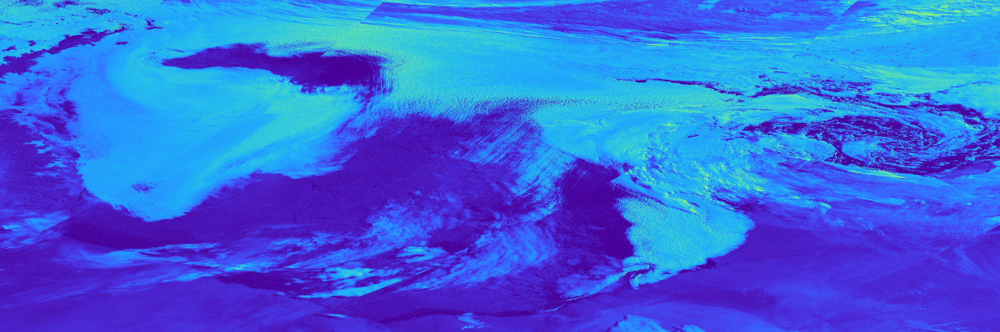

In [2]:
mp = Map(config)
mp.Maps(mesh,'SIC',predefined='SIC')
mp.Maps(mesh,'Elevation',predefined='Elev',show=False)
mp.Maps(mesh,'Fuel Usage',predefined='Fuel',show=False)
mp.Maps(mesh,'Extreme Ice',predefined='Extreme Sea Ice Conc')
mp.Maps(mesh,'Land Mask',predefined='Land Mask')

mp.Geotiff('Weddle_4326.tiff','Modis',show=False)

#mp.MeshInfo(mesh,'Mesh Info',show=False)
mp.Show()

In [ ]:
paths  = info['Paths']
waypoints = pd.DataFrame(info['config']['Route_Info']['WayPoints'])



mp = Map(config)
mp.Maps(mesh,'SIC',predefined='SIC')
mp.Maps(mesh,'Elevation',predefined='Elev',show=False)
mp.Maps(mesh,'Fuel Usage',predefined='Fuel',show=False)
mp.Maps(mesh,'Extreme Ice',predefined='Extreme Sea Ice Conc')
mp.Maps(mesh,'Land Mask',predefined='Land Mask')


mp.Paths(paths,'Routes - Fuel',predefined='Route Traveltime Paths')
mp.Paths(paths,'Routes - Fuel',predefined='Route Fuel Paths')



# Plotting Waypoints
ports = ['Halley','Rothera','Falklands']
waypoints_ports   = waypoints[waypoints['Name'].isin(ports)]
waypoints_science = waypoints[~waypoints['Name'].isin(ports)]
mp.Points(waypoints_ports,'Waypoints',icon='circle',marker_size=1.5,color='blue')
mp.Points(waypoints_ports,'Waypoints',icon='anchor',marker_size=1.0,color='white',names={"font_size":10.0})
mp.Points(waypoints_science,'Waypoints',icon='circle',marker_size=1.5,color='black')
mp.Points(waypoints_science,'Waypoints',icon='flask',marker_size=1.0,color='white',names={"font_size":10.0})


#mp.MeshInfo(mesh,'Mesh Info',show=False)
mp.Show()

In [ ]:
def io_paths(paths):

    if type(paths) is dict:
        import numpy as np
        pths_df_lst = []
        for pth in paths['features']:
            pth_sr = pd.Series(dtype='object')
            coords = np.array(pth['geometry']['coordinates'])
            pth_sr['coordinates'] = coords
            for key in pth['properties'].keys():
                pth_sr[key] = pth['properties'][key]
            pths_df_lst.append(pth_sr)
        pths_df = pd.DataFrame(pths_df_lst)
        return pths_df

    elif type(paths) is pd.core.frame.DataFrame:
        pths_geojson = {}
        pths_geojson['type']     = 'FeatureCollection'
        pths = []
        for idx,row in paths.iterrows():
            pth = {}
            pth['type'] = 'Feature'
            pth['geometry'] = {}
            pth['geometry']['type'] = 'LineString'
            pth['geometry']['coordinates'] = row['coordinates'].tolist()

            pth['properties']={}
            for key in row.index:
                if key != 'coordinates':
                    pth['properties'][key] = row[key]
            pths.append(pth)
            
        pths_geojson['features'] = pths
        return pths_geojson

    else:
        print('Please Specify either GeoJSON or Pandas DataFrame Form')

In [ ]:
pths_df = io_paths(paths)
pths_df = pths_df[pths_df['from'] == 'Halley']

pths_geojson = io_paths(pths_df)


In [ ]:
paths  = info['Paths']
waypoints = pd.DataFrame(info['config']['Route_Info']['WayPoints'])



mp = Map(config)
mp.Maps(mesh,'SIC',predefined='SIC')
mp.Maps(mesh,'Elevation',predefined='Elev',show=False)
mp.Maps(mesh,'Fuel Usage',predefined='Fuel',show=False)
mp.Maps(mesh,'Extreme Ice',predefined='Extreme Sea Ice Conc')
mp.Maps(mesh,'Land Mask',predefined='Land Mask')


mp.Paths(pths_geojson,'Routes - Traveltime',predefined='Route Traveltime Paths')
mp.Paths(pths_geojson,'Routes - Fuel',predefined='Route Fuel Paths')



# Plotting Waypoints
ports = ['Halley','Rothera','Falklands']
waypoints_ports   = waypoints[waypoints['Name'].isin(ports)]
waypoints_science = waypoints[~waypoints['Name'].isin(ports)]
mp.Points(waypoints_ports,'Waypoints',icon='circle',marker_size=1.5,color='blue')
mp.Points(waypoints_ports,'Waypoints',icon='anchor',marker_size=1.0,color='white',names={"font_size":10.0})
mp.Points(waypoints_science,'Waypoints',icon='circle',marker_size=1.5,color='black')
mp.Points(waypoints_science,'Waypoints',icon='flask',marker_size=1.0,color='white',names={"font_size":10.0})


mp.TimeData(pths_geojson)
#mp.MeshInfo(mesh,'Mesh Info',show=False)
mp.Show()

In [ ]:
import pandas as pd
import numpy as np
from scipy.interpolate import griddata

Artic_AMSR = pd.read_csv('AMSR_raw.csv')
Artic_AMSR = Artic_AMSR.rename(columns={'lat':'Lat'})
Artic_AMSR = Artic_AMSR.rename(columns={'long':'Long'})
Artic_AMSR['Name'] = 'Test'

xmin = -120
xmax = -10
xsep = 0.1
ymin = -75
ymax = -45
ysep = 0.1

X,Y = np.meshgrid(np.arange(xmin,xmax,xsep),np.arange(ymin,ymax,ysep))


Z = griddata(Artic_AMSR[['Long','Lat']].to_numpy(), Artic_AMSR['SIC'].to_numpy(), (X, Y), method='linear')*100


In [ ]:
import matplotlib.pylab as plt
plt.pcolormesh(X,Y,Z)
plt.colorbar()


In [ ]:
plt.scatter(Artic_AMSR['Long'],Artic_AMSR['Lat'],15,Artic_AMSR['SIC'])

In [ ]:
import folium
import copy
from branca.colormap import linear

colormap = linear._colormaps['BuPu_09'].scale(0.0,100.0)
Zc = np.zeros((Z.shape[0],Z.shape[1],4))
for ii in range(Zc.shape[0]):
    for jj in range(Zc.shape[1]):
        z = Z[ii,jj]
        if np.isnan(z):
            Zc[ii,jj,:] = 0.0
        else:
            Zc[ii,jj,:] = list(colormap.rgba_floats_tuple(z))

m = folium.Map([37, 0], zoom_start=1, tiles="stamentoner")

folium.raster_layers.ImageOverlay(
    image=Zc[::-1],
    bounds=[[ymin,xmin], [ymax,xmax]],
    mercator_project=True,
    opacity=0.6
).add_to(m)

Extr = copy.copy(Z)
Extr[Extr!=Extr] = 0.0
Extr[Extr<80] = 0.0
Extr[Extr>=80] = 1.0
folium.raster_layers.ImageOverlay(
    image=Extr[::-1],
    bounds=[[ymin,xmin], [ymax,xmax]],
    colormap=lambda x: (1, 0, 0, x),
    mercator_project=True,
    opacity=0.6
).add_to(m)





m

In [ ]:
import rasterio

In [ ]:
src = rasterio.open('Weddle_4326.tiff')
Z = src.read(2)[::10,::10]

def

colormap = linear._colormaps['viridis'].scale(Z.min(),Z.max())
Zc = np.zeros((Z.shape[0],Z.shape[1],4))
for ii in range(Zc.shape[0]):
    for jj in range(Zc.shape[1]):
        z = Z[ii,jj]
        if np.isnan(z):
            Zc[ii,jj,:] = 0.0
        else:
            Zc[ii,jj,:] = list(colormap.rgba_floats_tuple(z))

m = folium.Map([37, 0], zoom_start=1, tiles="stamentoner")

indx=1
trying=True
while trying:
    # try:

    if indx==1:
        opc = 0.8
        shw = True
    else:
        opc = 0.7
        shw = False

    Z = src.read(indx)[::10,::10]
    colormap = linear._colormaps['viridis'].scale(Z.min(),Z.max())
    Zc = np.zeros((Z.shape[0],Z.shape[1],4))
    for ii in range(Z.shape[0]):
        for jj in range(Z.shape[1]):
            z = Z[ii,jj]
            if np.isnan(z):
                Zc[ii,jj,:] = 0.0
            else:
                Zc[ii,jj,:] = list(colormap.rgba_floats_tuple(z))


    img = folium.raster_layers.ImageOverlay(
        name="Band {}".format(indx),
        bounds = [[src.bounds[1], src.bounds[0]], [src.bounds[3], src.bounds[2]]],
        image=Zc,
        opacity=opc,
        mercator_project=True,
        pixelated=False,
        show = shw
    )
    img.add_to(m)
    # except:
    #     trying=False
    indx+=1

folium.LayerControl().add_to(m)
m

In [ ]:
folium.LayerControl().add_to(m)
m